In [1]:
from diffusers.models import AutoencoderKL
import os, glob, numpy as np
import torch
import torch.nn as nn
from matplotlib import pyplot as plt
from tqdm import tqdm
from torch import optim
import torch.nn.functional as F
from torchvision.utils import make_grid, save_image
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import datasets, transforms
from PIL import Image
import math


In [2]:
isTrain = False
make_anime_ds = False
isLoraTrain = False

### UNet Implementation
This time, we will be creating our own UNet implementation, as followed by this great video:
https://www.youtube.com/watch?v=TBCRlnwJtZU&t=932s<br>
This time, for our latent diffusion process, we will be importing a pretrained VAE from hugging face. (Since our implementation seemed lacking)

#### VAE parameters
We will be generating 256x256 images, using a latent space of 32x32x4 (since this is what the pretrained VAE model comes with), so we define some global parameters for use later.

In [5]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse").to("cuda")
vae.eval() 
for p in vae.parameters():  p.requires_grad = False # freeze vae parameters

IMAGE_SIZE = 256
LATENT_CH = vae.config.latent_channels
SCALE = getattr(vae.config, "scaling_factor", 0.18215)
DOWNSAMPLE_F  = 8
LATENT_H = IMAGE_SIZE // DOWNSAMPLE_F 
LATENT_W = IMAGE_SIZE // DOWNSAMPLE_F 

#### UNet architecture

The UNet will be using Multihead attention layers, and "Resnet" blocks for the downsampling and upsampling that are defined as "DoubleConv" layers.
Note that we also define embedding layers to the down and up layers, to inject the timestep "t" into the process.

#### Layer definitions

In [4]:
class SelfAttention(nn.Module):
    def __init__(self, channels):
        super(SelfAttention, self).__init__()
        self.mha = nn.MultiheadAttention(channels, 4, batch_first=True)
        self.ln1 = nn.LayerNorm(channels)
        self.ff = nn.Sequential(
            nn.LayerNorm(channels),
            nn.Linear(channels, channels),
            nn.GELU(),
            nn.Linear(channels, channels),
        )
    def forward(self, x):
        b,c,h,w = x.shape
        x_ = x.view(b, c, h*w).transpose(1, 2)
        x_ln = self.ln1(x_)
        attn, _ = self.mha(x_ln, x_ln, x_ln)
        x_ = x_ + attn
        x_ = x_ + self.ff(x_)

        return x_.transpose(1, 2).view(b, c, h, w)

In [6]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None, residual=False):
        super().__init__()
        self.residual = residual
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, mid_channels),
            nn.GELU(),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, out_channels),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.double_conv(x))
        else:
            return self.double_conv(x)

In [7]:
class Down(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb

In [8]:
class Up(nn.Module):
    def __init__(self, in_channels, out_channels, emb_dim=256):
        super().__init__()

        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = nn.Sequential(
            DoubleConv(in_channels, in_channels, residual=True),
            DoubleConv(in_channels, out_channels, in_channels // 2),
        )

        self.emb_layer = nn.Sequential(
            nn.SiLU(),
            nn.Linear(
                emb_dim,
                out_channels
            ),
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        emb = self.emb_layer(t)[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb

#### UNet Definition
We use our previously defined layers to define the UNet. Note that t gets encoded using sin cos waves positional encoding.

In [9]:
class UNet(nn.Module):
    def __init__(self, c_in=4, c_out=4, time_dim=256, base=128, device="cuda"):
        super().__init__()
        self.device = device
        self.time_dim = time_dim
        
        self.inc = DoubleConv(c_in, base)
        self.d1 = Down(base, base*2) # 32 -> 16
        self.sa1 = SelfAttention(base*2)
        self.d2 = Down(base*2, base*4) # 16 -> 8
        self.sa2 = SelfAttention(base*4)
        self.d3 = Down(base*4, base*4) # 8 -> 4
        self.sa3 = SelfAttention(base*4)

        self.bot1 = DoubleConv(base*4, base*8)
        self.bot2 = DoubleConv(base*8, base*8)
        self.bot3 = DoubleConv(base*8, base*4)

        self.u1   = Up(base*8, base*2)     # 4 -> 8
        self.sa4  = SelfAttention(base*2)
        self.u2   = Up(base*4, base)       # 8 -> 16
        self.sa5  = SelfAttention(base)
        self.u3   = Up(base*2, base)       # 16 -> 32
        self.sa6  = SelfAttention(base)

        self.outc = nn.Conv2d(base, c_out, 1)

    def pos_encoding(self, t, channels):
        inv_freq = 1.0 / (
            10000
            ** (torch.arange(0, channels, 2, device=self.device).float() / channels)
        )
        pos_enc_a = torch.sin(t.repeat(1, channels // 2) * inv_freq)
        pos_enc_b = torch.cos(t.repeat(1, channels // 2) * inv_freq)
        pos_enc = torch.cat([pos_enc_a, pos_enc_b], dim=-1)
        return pos_enc

    def forward(self, x, t):
        t = self.pos_encoding(t.unsqueeze(-1).float(), self.time_dim)

        x1 = self.inc(x)
        x2 = self.sa1(self.d1(x1, t))
        x3 = self.sa2(self.d2(x2, t))
        x4 = self.sa3(self.d3(x3, t))

        x4 = self.bot3(self.bot2(self.bot1(x4)))

        x  = self.sa4(self.u1(x4, x3, t))
        x  = self.sa5(self.u2(x,  x2, t))
        x  = self.sa6(self.u3(x,  x1, t))
        return self.outc(x)

### Same old diffusion process
As with our previous attempts, the actual diffusion process remains about the same. 

In [10]:
class LatentDiffusion:
    def __init__(self, noise_steps=1000, beta_start=1e-4, beta_end=0.02, latent_shape=(4, 32, 32), device="cuda"):
        self.noise_steps = noise_steps
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.device = device
        self.latent_shape = latent_shape

        self.beta = self.prepare_noise_schedule().to(device)
        self.alpha = 1. - self.beta
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

    def prepare_noise_schedule(self):
        return torch.linspace(self.beta_start, self.beta_end, self.noise_steps)

    def noise_latents(self, z0, t):
        """Add noise to latents z0 at timestep t."""
        sqrt_alpha_hat = torch.sqrt(self.alpha_hat[t])[:, None, None, None]
        sqrt_one_minus_alpha_hat = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None]
        eps = torch.randn_like(z0)
        return sqrt_alpha_hat * z0 + sqrt_one_minus_alpha_hat * eps, eps

    def sample_timesteps(self, n):
        return torch.randint(low=1, high=self.noise_steps, size=(n,), device=self.device)

    def p_sample_loop(self, model, n):
        """Sample latents then decode to images."""
        c, h, w = self.latent_shape
        x = torch.randn((n, c, h, w), device=self.device)

        model.eval()
        with torch.no_grad():
            for i in tqdm(reversed(range(1, self.noise_steps)), position=0):
                t = torch.full((n,), i, device=self.device, dtype=torch.long)
                eps_theta = model(x, t)
                alpha      = self.alpha[t][:, None, None, None]
                alpha_hat  = self.alpha_hat[t][:, None, None, None]
                beta       = self.beta[t][:, None, None, None]
                noise = torch.randn_like(x) if i > 1 else 0
                x = (1/torch.sqrt(alpha)) * (x - (1 - alpha)/torch.sqrt(1 - alpha_hat) * eps_theta) + torch.sqrt(beta) * noise
        model.train()
        return x

### Helper Functions for training

In [11]:
def decode_latents(vae, z, scale):
    with torch.no_grad():
        x = vae.decode(z / scale).sample  # [-1,1]
    x = (x.clamp(-1, 1) + 1) / 2           # [0,1]
    return x

def sample_and_decode(diffusion, model, vae, scale, n):
    z = diffusion.p_sample_loop(model, n)
    imgs = decode_latents(vae, z, scale)
    return imgs

In [12]:
def plot_loss_and_images(loss_curve, grid_tensor, save_path=None, title=""):
    """loss_curve: list of floats (epoch-level), grid_tensor: CHW in [0,1]"""
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    # Loss curve
    axes[0].plot(range(1, len(loss_curve)+1), loss_curve, marker='o')
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("MSE loss")
    axes[0].set_title("Training loss")
    axes[0].grid(True, alpha=0.3)

    # Image grid
    axes[1].imshow(grid_tensor.permute(1, 2, 0).cpu().numpy())
    axes[1].axis("off")
    axes[1].set_title(title)

    plt.tight_layout()
    if save_path is not None:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=150)
    plt.show()
    plt.close(fig)

In [13]:
def save_checkpoint(path, model, optimizer, scaler, global_step, epoch,
                    epoch_losses, step_losses):
    os.makedirs(os.path.dirname(path), exist_ok=True)
    torch.save({
        "model":       model.state_dict(),
        "optimizer":   optimizer.state_dict(),
        "scaler":      scaler.state_dict(),
        "global_step": global_step,
        "epoch":       epoch,
        "epoch_losses": epoch_losses,
        "step_losses":  step_losses,
    }, path)

### Training
This time, we will be outputting samples and graphs mid run to help visualize the training process.

In [14]:
def train(vae, optimizer, dataloader, epochs,
          device="cuda",
          sample_every_steps=20000,
          n_sample_imgs=8,
          out_dir="results",
          ckpt_dir="checkpoints_v2",
          model=None):
    latent_shape = (LATENT_CH, LATENT_H, LATENT_W)

    if model is None:
        model = UNet(c_in=LATENT_CH, c_out=LATENT_CH, base=128,
                     time_dim=256, device=device).to(device)

    mse = nn.MSELoss()
    diffusion = LatentDiffusion(latent_shape=latent_shape, device=device)
    scaler = torch.amp.GradScaler(device="cuda")  

    epoch_losses, step_losses = [], []
    global_step = 0

    for epoch in range(epochs):
        model.train()
        running = 0.0
        pbar = tqdm(enumerate(dataloader, 1),
                    total=len(dataloader),
                    leave=False,
                    desc=f"Epoch {epoch+1}/{epochs}")

        for step_in_epoch, (images, _) in pbar:
            images = images.to(device)

            with torch.no_grad():
                dist = vae.encode(images).latent_dist
                z0 = dist.sample() * SCALE

            t = diffusion.sample_timesteps(z0.size(0))
            z_t, noise = diffusion.noise_latents(z0, t)

            optimizer.zero_grad(set_to_none=True)
            with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
                pred_noise = model(z_t, t)
                loss = mse(noise, pred_noise)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            running += loss.item()
            step_losses.append(loss.item())
            global_step += 1
            pbar.set_postfix(MSE=f"{loss.item():.4f}",
                             step=global_step,
                             ep_step=step_in_epoch)

            # ---- sample + checkpoint ----
            if global_step % sample_every_steps == 0:
                model.eval()
                with torch.no_grad():
                    imgs = sample_and_decode(diffusion, model, vae, SCALE, n_sample_imgs)
                grid = make_grid(imgs, nrow=int(math.ceil(math.sqrt(n_sample_imgs))), padding=2)
                fig_path = os.path.join(out_dir, f"step_{global_step:07d}.png")
                plot_loss_and_images(step_losses, grid, save_path=fig_path,
                                     title=f"step {global_step} | epoch {epoch} | loss {loss.item():.4f}")

                ckpt_path = os.path.join(ckpt_dir, f"diffv2_step_{global_step:07d}.pt")
                save_checkpoint(ckpt_path, model, optimizer, scaler,
                                global_step, epoch, epoch_losses, step_losses)
                model.train()

        epoch_losses.append(running / len(dataloader))

    # final save
    final_ckpt = os.path.join(ckpt_dir, "diffv2_final.pt")
    save_checkpoint(final_ckpt, model, optimizer, scaler,
                    global_step, epoch, epoch_losses, step_losses)
    
    # final sample
    model.eval()
    with torch.no_grad():
        imgs = sample_and_decode(diffusion, model, vae, SCALE, n_sample_imgs)
        grid = make_grid(imgs, nrow=int(math.ceil(math.sqrt(n_sample_imgs))), padding=2)
        fig_path = os.path.join(out_dir, f"final.png")
        plot_loss_and_images(step_losses, grid, save_path=fig_path,
                                title=f"step {global_step} | epoch {epoch}")

    return model, epoch_losses, step_losses

### Dataset Preprocessing
This time, we used a class to preprocess our data, since it's not implemented in Pytorch, we had to manually download the data and load it into a dataset.
We used the CelebA dataset, centercropped and resized to 256x256 images. We also only used the first 40k pictures, since the dataset is very big and training time would take too long.

In [15]:
class CelebAAlignDataset(Dataset):
    def __init__(self, root, transform=None):
        """
        root: path to the img_align_celeba folder (directly containing the pngs)
        """
        self.root = root
        self.paths = sorted(glob.glob(os.path.join(root, "*.png")))
        if len(self.paths) == 0:
            raise RuntimeError(f"No png files found under {root}")
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, 0   # dummy label

def get_celeba_align_loader(root,
                            batch_size=12,
                            image_size=256,
                            subset_pct=1.0,
                            num_workers=None,
                            shuffle=True,
                            seed=42):
    if num_workers is None:
        import os as _os
        num_workers = max(_os.cpu_count() // 2, 2)

    tfm = transforms.Compose([
        transforms.CenterCrop(178),                     # keep face centered
        transforms.Resize(image_size, antialias=True),
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)          # -> [-1,1]
    ])

    ds = CelebAAlignDataset(root=root, transform=tfm)

    if subset_pct < 1.0:
        rng = np.random.default_rng(seed)
        idx = rng.permutation(len(ds))[:int(len(ds)*subset_pct)]
        ds = Subset(ds, idx)

    loader = DataLoader(ds,
                        batch_size=batch_size,
                        shuffle=shuffle,
                        num_workers=num_workers,
                        pin_memory=True,
                        persistent_workers=num_workers > 0,
                        prefetch_factor=2 if num_workers > 0 else None)
    return loader

In [16]:
root = "./celeba/img_align_celeba_png"
train_loader = get_celeba_align_loader(root, batch_size=12, image_size=IMAGE_SIZE, subset_pct=1.0, num_workers=0, shuffle=True)

RuntimeError: No png files found under ./celeba/img_align_celeba_png

#### Defining and running the training

In [ ]:
model = UNet(c_in=LATENT_CH, c_out=LATENT_CH, base=128, time_dim=256, device="cuda").to("cuda")
optimizer = torch.optim.AdamW(model.parameters(), lr=9.6e-5)

999it [00:11, 90.60it/s]██▉| 3329/3334 [11:27<00:01,  4.85it/s, MSE=0.1193, ep_step=3330, step=2e+4] 


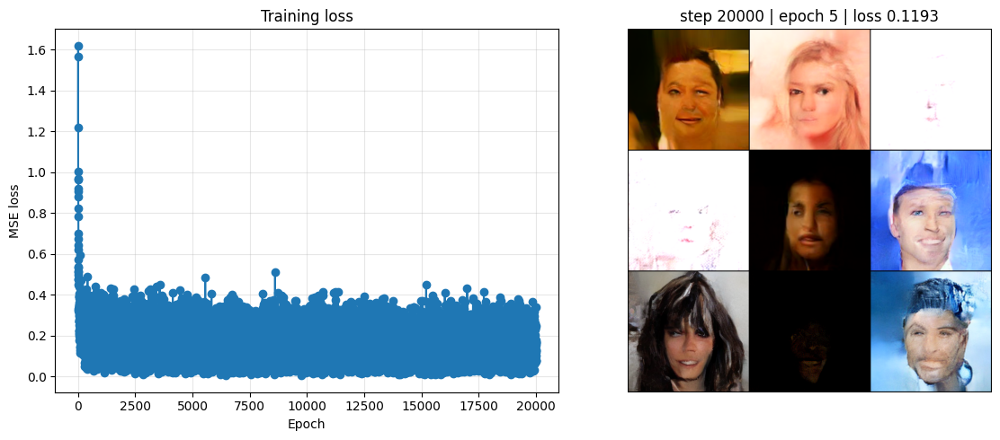

999it [00:10, 94.49it/s]███▉| 3325/3334 [11:12<00:01,  4.97it/s, MSE=0.1181, ep_step=3326, step=4e+4] 


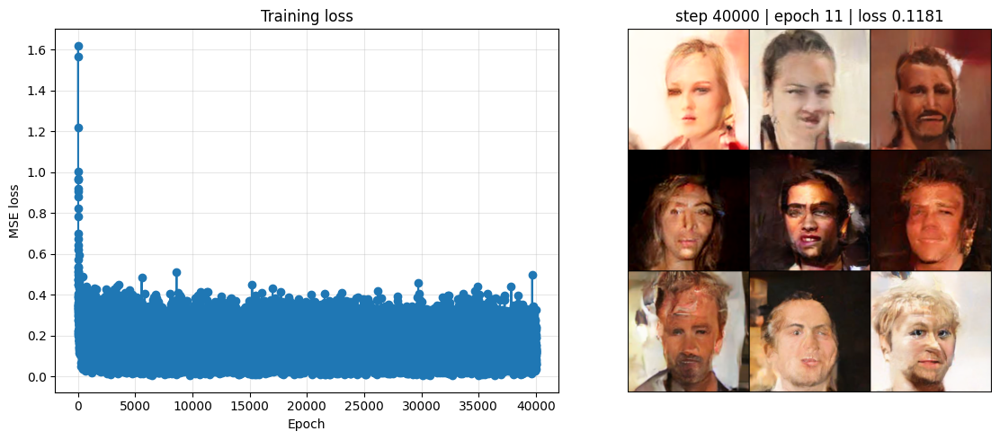

999it [00:10, 96.02it/s]███▉| 3321/3334 [10:35<00:02,  5.23it/s, MSE=0.1044, ep_step=3322, step=6e+4] 


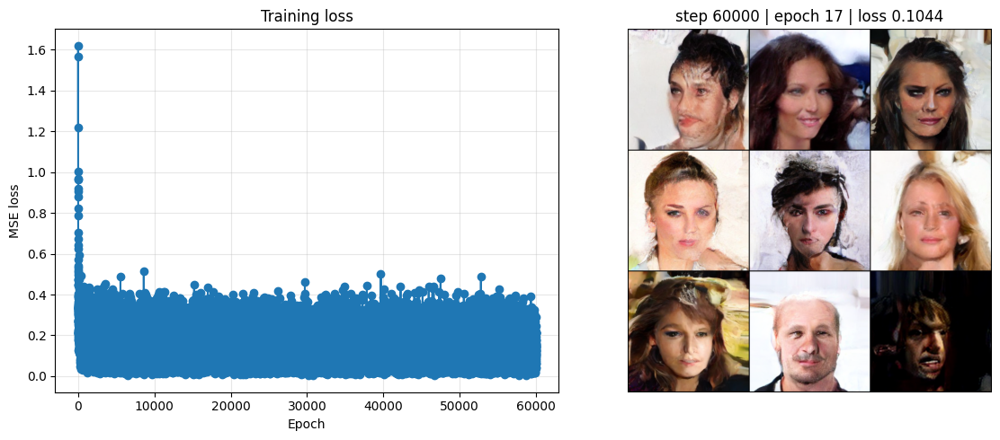

999it [00:10, 95.93it/s]███▉| 3317/3334 [10:35<00:03,  5.24it/s, MSE=0.0721, ep_step=3318, step=8e+4] 


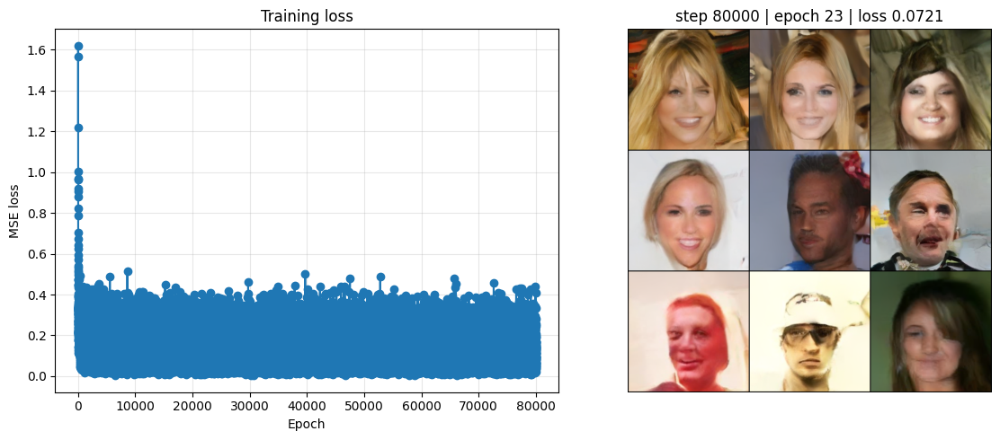

999it [00:10, 95.69it/s]███▉| 3313/3334 [10:34<00:04,  5.24it/s, MSE=0.1317, ep_step=3314, step=1e+5] 


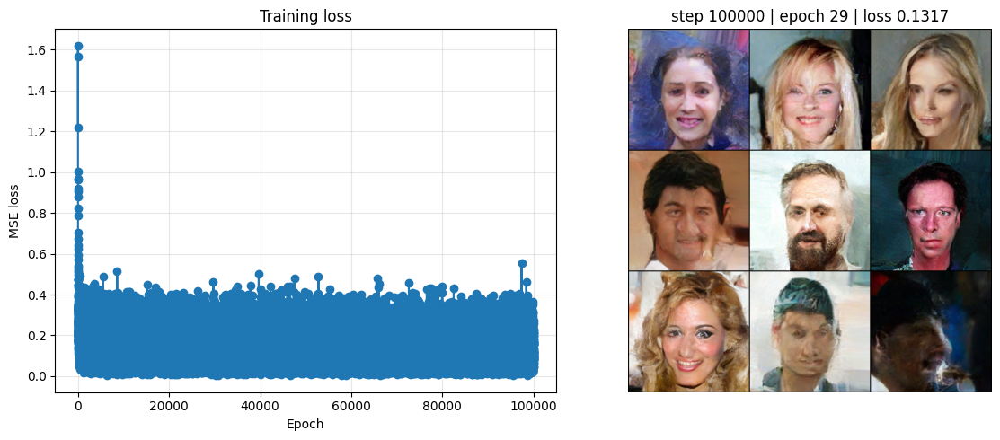

999it [00:10, 95.64it/s]███▉| 3309/3334 [10:33<00:04,  5.23it/s, MSE=0.1382, ep_step=3310, step=120000]


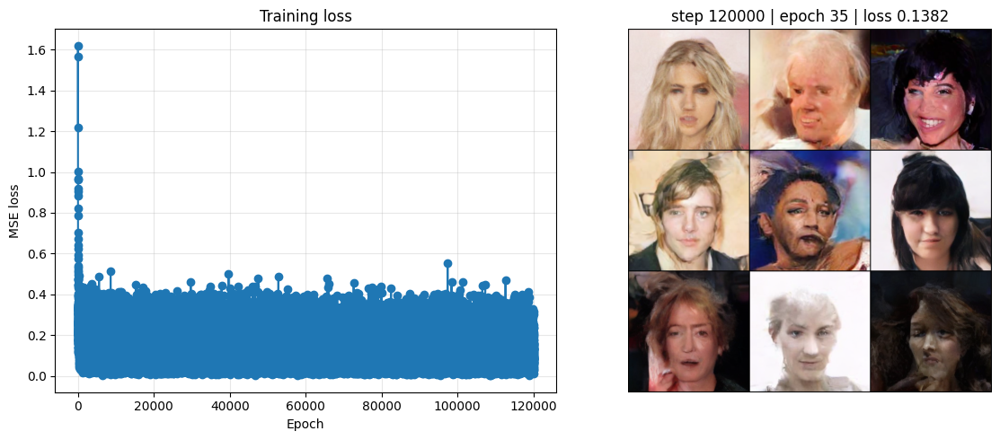

999it [00:10, 96.02it/s]███▉| 3305/3334 [10:33<00:05,  5.21it/s, MSE=0.0589, ep_step=3306, step=140000]


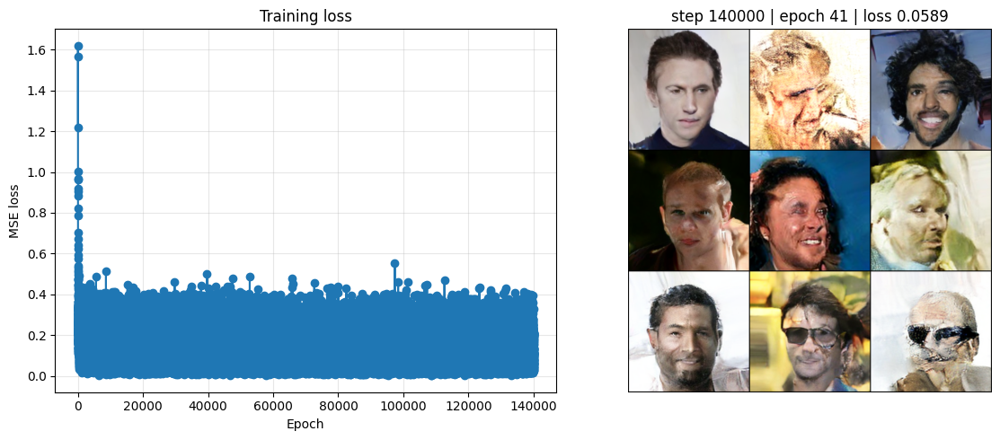

999it [00:10, 95.97it/s]███▉| 3301/3334 [10:31<00:06,  5.24it/s, MSE=0.2131, ep_step=3302, step=160000]


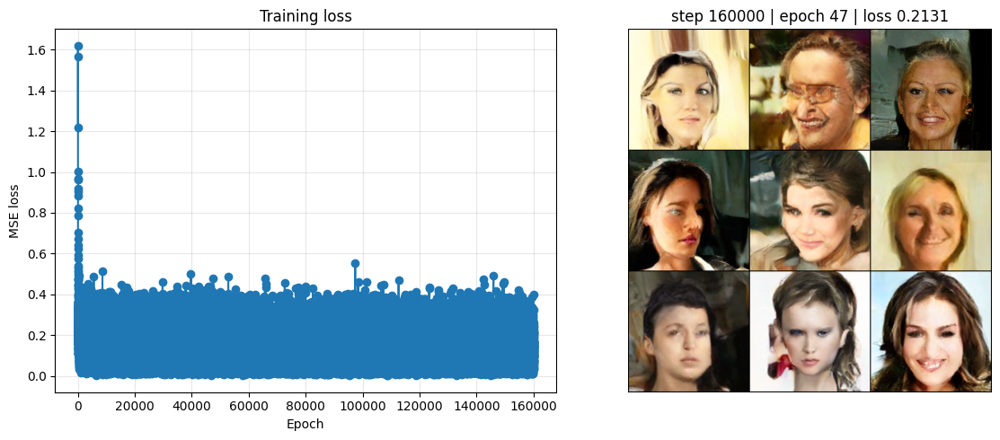

999it [00:10, 95.99it/s]███▉| 3297/3334 [10:33<00:07,  5.19it/s, MSE=0.0106, ep_step=3298, step=180000]


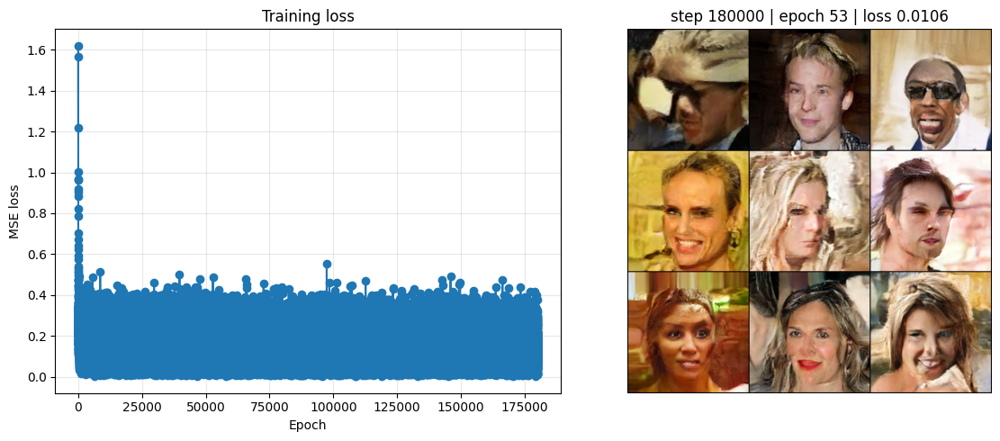

999it [00:10, 93.84it/s]███▉| 3293/3334 [10:34<00:07,  5.14it/s, MSE=0.1047, ep_step=3294, step=2e+5]  


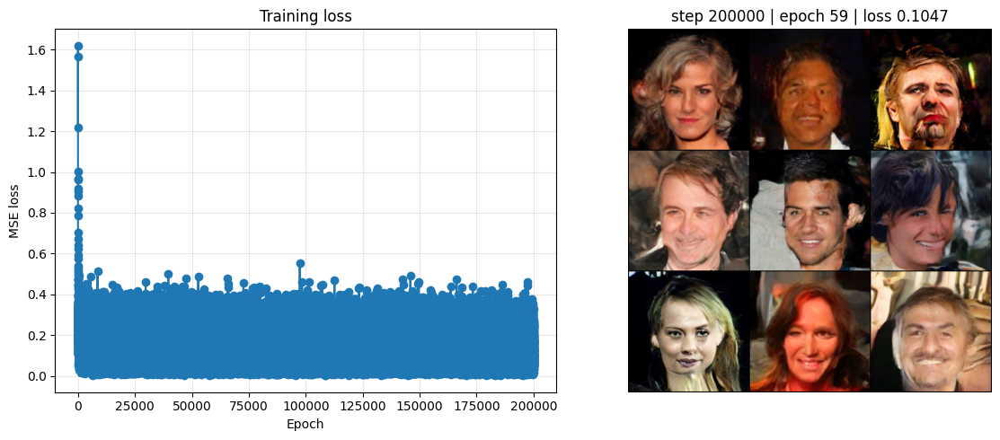

999it [00:10, 94.20it/s]                                                                             


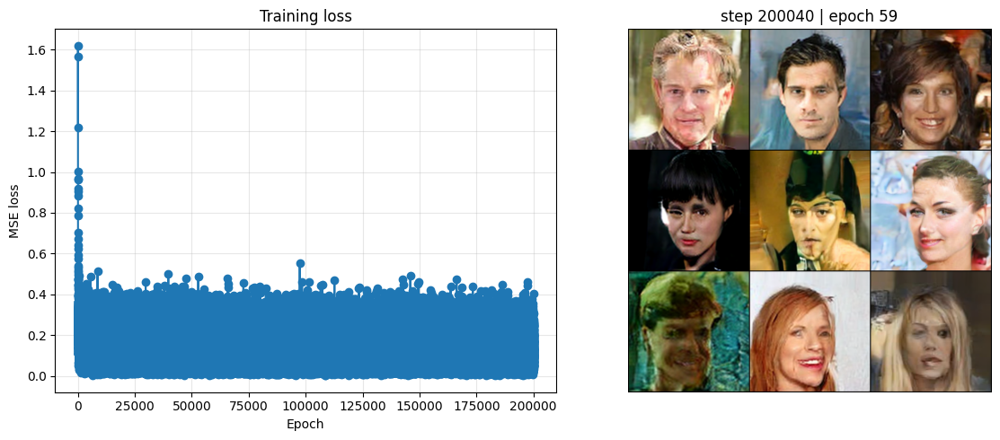

In [ ]:
if isTrain:
    epoch_losses, step_losses = [], []
    _, epoch_losses, step_losses = train(vae, optimizer, train_loader, 60, "cuda", 20000, 9, "results", "checkpoints_v2", model=model)

We've got some pretty nice looking generations for the amount of data we provided!
We accidently used MSE loss per step, instead of per epoch (even though it says epoch at the bottom of the graphs, we obviously did not train for 200000 epochs...) so the graphs are noisy and can be ignored. We will generate the actual loss graph now:

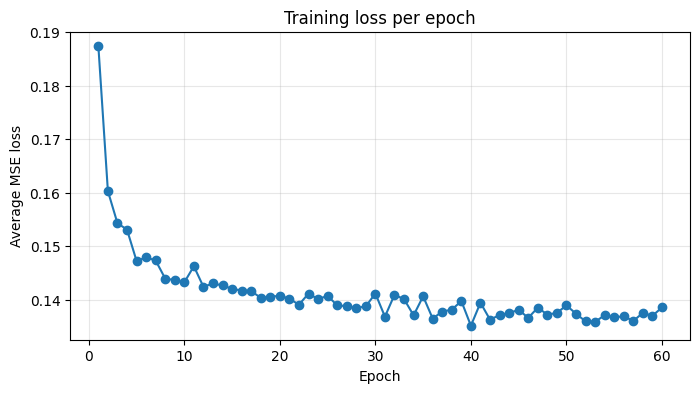

In [ ]:
if isTrain:
    plt.figure(figsize=(8, 4))
    plt.plot(range(1, len(epoch_losses) + 1), epoch_losses, marker="o")
    plt.xlabel("Epoch")
    plt.ylabel("Average MSE loss")
    plt.title("Training loss per epoch")
    plt.grid(alpha=0.3)
    plt.show()

### LoRa (Fine Tuning)

Low‐rank adaptation (LoRA) is a parameter‐efficient fine‐tuning technique that “injects” small, trainable low‐rank weight matrices into a frozen pre‐trained network (typically inside its attention or projection layers). Instead of updating the full dense weight, you approximate the weight update as the product of two much smaller matrices A and B (of rank r ≪ full dimension), which drastically reduces the number of trainable parameters and speeds up training, while still allowing the model to adapt effectively to a new task. The rank r controls the expressiveness of the adaptation (higher r can capture more complex changes but adds more parameters), and an additional scalar α is used to scale the combined update (ΔW=αBA), effectively controlling the overall step size of the low‐rank update.

#### Creating a small dataset for fine tuning on
We've handpicked 30 images of anime characters from "Re:Zero" for consistent art styling.
First, we centercrop and resize the pictures to 256x256

In [ ]:
from pathlib import Path

if make_anime_ds:
    input_dir  = "anime_ds_raw"      
    output_dir = "anime256"            
    target_res = 256

    os.makedirs(output_dir, exist_ok=True)

    def center_crop_square(img: Image.Image) -> Image.Image:
        """Take the largest centered square from the image."""
        w, h = img.size
        side = min(w, h)
        left = (w - side) // 2
        top  = (h - side) // 2
        return img.crop((left, top, left + side, top + side))

    png_paths = sorted(glob.glob(os.path.join(input_dir, "*.png")))
    print(f"Found {len(png_paths)} PNGs in {input_dir}")

    for i, path in enumerate(png_paths, 1):
        img = Image.open(path).convert("RGB")           # ensure 3‑channel
        img = center_crop_square(img)
        img = img.resize((target_res, target_res), Image.LANCZOS)

        out_name = f"{i:02d}.png"
        out_path = os.path.join(output_dir, out_name)
        img.save(out_path, format="PNG", optimize=True)
        print(f"[{i:02}/{len(png_paths)}] saved {out_path}")


Found 30 PNGs in anime_ds_raw
[01/30] saved anime256\01.png
[02/30] saved anime256\02.png
[03/30] saved anime256\03.png
[04/30] saved anime256\04.png
[05/30] saved anime256\05.png
[06/30] saved anime256\06.png
[07/30] saved anime256\07.png
[08/30] saved anime256\08.png
[09/30] saved anime256\09.png
[10/30] saved anime256\10.png
[11/30] saved anime256\11.png
[12/30] saved anime256\12.png
[13/30] saved anime256\13.png
[14/30] saved anime256\14.png
[15/30] saved anime256\15.png
[16/30] saved anime256\16.png
[17/30] saved anime256\17.png
[18/30] saved anime256\18.png
[19/30] saved anime256\19.png
[20/30] saved anime256\20.png
[21/30] saved anime256\21.png
[22/30] saved anime256\22.png
[23/30] saved anime256\23.png
[24/30] saved anime256\24.png
[25/30] saved anime256\25.png
[26/30] saved anime256\26.png
[27/30] saved anime256\27.png
[28/30] saved anime256\28.png
[29/30] saved anime256\29.png
[30/30] saved anime256\30.png


Now we load it into a dataset

In [ ]:
class AnimeDataset(Dataset):
    def __init__(self, root, transform=None):
        """
        root: path to the img_align_celeba folder (directly containing the pngs)
        """
        self.root = root
        self.paths = sorted(glob.glob(os.path.join(root, "*.png")))
        if len(self.paths) == 0:
            raise RuntimeError(f"No png files found under {root}")
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, 0   

We then further speed up training, by creating a "latent" dataset from our original dataset, that pre-encodes all the images using the VAE, so that the training loop does not need to encode each time.

In [ ]:
# create latent dataset
anime_ds = AnimeDataset(
    root="anime256",
    transform=transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        
        transforms.ToTensor(),
        transforms.Normalize([0.5]*3, [0.5]*3)  # -> [-1,1]
    ])
)

enc_loader = DataLoader(anime_ds, batch_size=64, num_workers=0)
latents = []
with torch.no_grad():
    for imgs,_ in enc_loader:
        z = vae.encode(imgs.cuda()).latent_dist.sample() * SCALE
        latents.append(z.cpu())
torch.save(torch.cat(latents), "anime_latents.pt")

#### The LoRa layers
We define a Lora convolution layer that will wrap around every Convolution layer inside our model, freezing them. We can also pass the rank and alpha to the model.

In [14]:
class LoRAConv2d(nn.Module):
    """
    Drop-in replacement for nn.Conv2d that adds a low-rank delta W.
    The original conv weight & bias are kept (and frozen by default).
    """
    def __init__(self, conv: nn.Conv2d, rank: int = 4, alpha: float = 1.0, train_bias=False):
        super().__init__()
        self.conv = conv                           # original layer
        self.conv.requires_grad_(False)            # freeze base params

        in_c  = conv.in_channels * conv.kernel_size[0] * conv.kernel_size[1]
        out_c = conv.out_channels

        # LoRA A & B matrices (random init like the paper)
        self.A = nn.Parameter(torch.randn(rank, in_c) * 0.01)
        self.B = nn.Parameter(torch.zeros(out_c, rank))

        self.scaling = alpha / rank
        if train_bias and conv.bias is not None:
            conv.bias.requires_grad_(True)

    def forward(self, x):
        w = self.conv.weight      # [out, in, kH, kW]
        delta_w = (self.B @ self.A) \
                    .view_as(w) * self.scaling      # same shape as w
        return F.conv2d(
            x, w + delta_w, bias=self.conv.bias,
            stride=self.conv.stride,
            padding=self.conv.padding,
            dilation=self.conv.dilation,
            groups=self.conv.groups,
        )

We define a function to wrap the existing Conv2d layers with our Lora layers:

In [15]:
# layer filter default = wrap all Conv2d layers.
def apply_lora_to_unet(unet, rank=2, alpha=1.0, layer_filter=None):
    if layer_filter is None:
        layer_filter = lambda n, m: isinstance(m, nn.Conv2d)

    for name, module in list(unet.named_modules()):
        if layer_filter(name, module):
            parent, child_name = _split_parent(unet, name)
            setattr(parent, child_name,
                    LoRAConv2d(module, rank=rank, alpha=alpha))
    return unet

def _split_parent(root, full_name):
    *parent_keys, last = full_name.split(".")
    parent = root
    for k in parent_keys:
        parent = getattr(parent, k)
    return parent, last

In [ ]:
unet = UNet(c_in=LATENT_CH, c_out=LATENT_CH, base=128, time_dim=256, device="cuda").to("cuda")
ckpt = torch.load("./checkpoints_v2/diffv2_final.pt", map_location="cpu")
unet_state = ckpt["model"]
unet.load_state_dict(unet_state)   
unet = apply_lora_to_unet(unet, rank=2, alpha=1.0)
unet = unet.to("cuda")

In [22]:
from itertools import cycle

latents = torch.load("anime_latents.pt").to("cuda")
lds = torch.utils.data.TensorDataset(latents)
loader = DataLoader(lds, batch_size=4, shuffle=True)

# make an infinite iterator so we can train for max_steps
inf_loader = cycle(loader)

lora_params = [p for n,p in unet.named_parameters() if p.requires_grad]
opt = torch.optim.AdamW(lora_params, lr=2e-4)
scaler = torch.amp.GradScaler("cuda")

diffusion = LatentDiffusion(latent_shape=(LATENT_CH, LATENT_H, LATENT_W), device="cuda")


In [ ]:
# ---------- training settings ----------
max_steps      = 10_000          
preview_every  = 500
preview_dir    = "lora_samples"
ckpt_path      = "anime_lora.pt"
os.makedirs(preview_dir, exist_ok=True)

In [20]:
def generate_preview(unet, diffusion, vae, scale,
                     n_imgs: int = 9,
                     grid_rows: int | None = None,
                     out_path: str | None = None,
                     device: str = "cuda",
                     title: str | None = None):
    
    grid_rows = grid_rows or int(math.ceil(math.sqrt(n_imgs)))
    unet.eval()
    with torch.no_grad():
        z = diffusion.p_sample_loop(unet, n_imgs).to(device)   # latents
        imgs = vae.decode(z / scale).sample                    # [-1,1]
    unet.train()

    imgs = (imgs.clamp(-1,1) + 1) / 2                         # [0,1]
    grid = make_grid(imgs, nrow=grid_rows, padding=2)

    if out_path:
        os.makedirs(os.path.dirname(out_path), exist_ok=True)
        save_image(grid, out_path)

    plt.figure(figsize=(4,4))
    plt.axis("off")
    if title:
        plt.title(title)
    plt.imshow(grid.permute(1,2,0).cpu())
    plt.show()

In [ ]:
if isLoraTrain:
    for step in range(1, max_steps + 1):
        (z0,) = next(inf_loader)
        z0 = z0.to("cuda")                           # latents on GPU

        t    = diffusion.sample_timesteps(z0.size(0))
        z_t, noise = diffusion.noise_latents(z0, t)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast(device_type="cuda", dtype=torch.float16):
            pred = unet(z_t, t)                      # UNet with LoRA
            loss = F.mse_loss(pred, noise)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()

        if step % 100 == 0:
            print(f"{step:>6} | loss {loss.item():.4f}")

        # -------- preview + save LoRA weights --------
        if step % preview_every == 0 or step == max_steps:
            out_png = os.path.join(preview_dir, f"step_{step:05d}.png")
            unet.eval()
            generate_preview(unet, diffusion, vae, SCALE,
                            n_imgs=9, out_path=out_png,
                            title=f"LoRA step {step}")

            lora_state = {k: v for k, v in unet.state_dict().items()
                if k.endswith((".A", ".B"))}

            info = {
                "rank": next(iter(lora_state.values())).shape[0],
                "layers": sorted({k.rsplit(".", 1)[0] for k in lora_state}),
                "state_dict": lora_state,
            }
            torch.save(info, "anime_lora.pt")

#### Results
Note that these results came from a different notebook (same code) so they are in markdown.

100 | loss 0.2197
   200 | loss 0.0036
   300 | loss 0.1001
   400 | loss 0.0011
   500 | loss 0.1876
999it [00:15, 66.28it/s]<br>
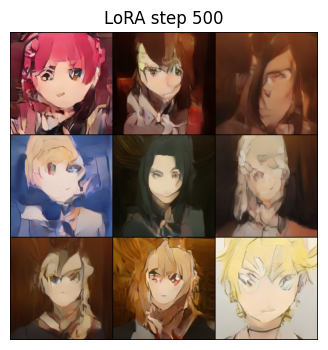<br>
600 | loss 0.0391
   700 | loss 0.2259
   800 | loss 0.0864
   900 | loss 0.1841
  1000 | loss 0.0093
999it [00:15, 66.00it/s]<br>
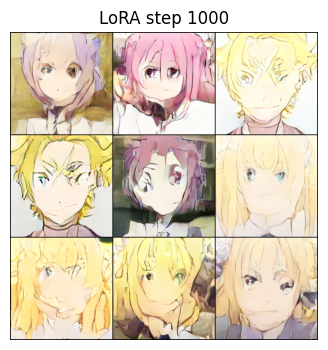<br>
1100 | loss 0.0307
  1200 | loss 0.1423
  1300 | loss 0.1976
  1400 | loss 0.0545
  1500 | loss 0.1112
999it [00:15, 64.81it/s]<br>
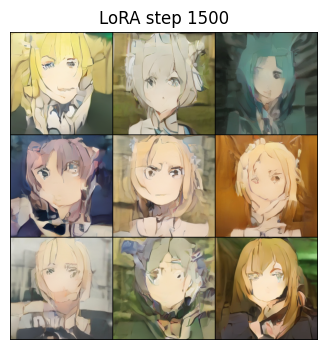<br>
1600 | loss 0.0616
  1700 | loss 0.0573
  1800 | loss 0.1202
  1900 | loss 0.1514
  2000 | loss 0.4802
999it [00:14, 67.39it/s]<br>
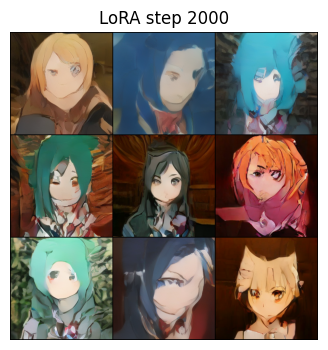<br>
2100 | loss 0.0572
  2200 | loss 0.3220
  2300 | loss 0.1239
  2400 | loss 0.2673
  2500 | loss 0.0966
999it [00:14, 66.98it/s]<br>
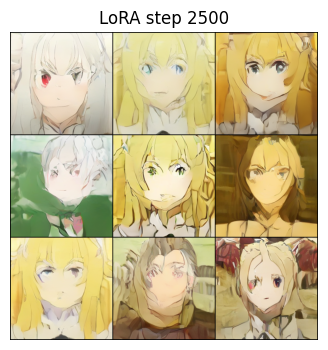<br>
2600 | loss 0.0510
  2700 | loss 0.0708
  2800 | loss 0.0042
  2900 | loss 0.1188
  3000 | loss 0.1476
999it [00:14, 66.61it/s]<br>
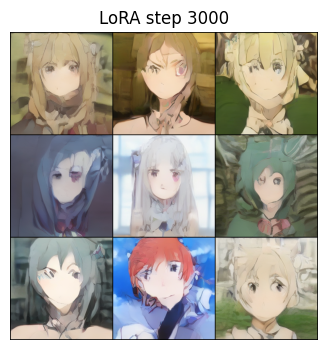<br>
3100 | loss 0.1877
  3200 | loss 0.0886
  3300 | loss 0.0297
  3400 | loss 0.2540
  3500 | loss 0.1606
999it [00:14, 67.10it/s]<br>
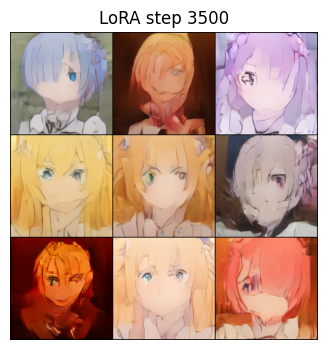<br>
3600 | loss 0.0487
  3700 | loss 0.2682
  3800 | loss 0.0455
  3900 | loss 0.1375
  4000 | loss 0.4496
999it [00:15, 66.60it/s]<br>
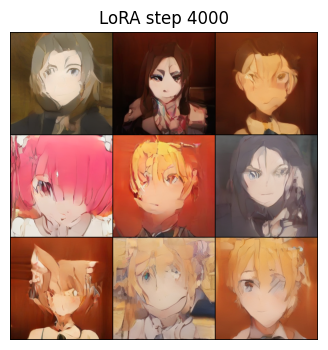<br>
4100 | loss 0.1281
  4200 | loss 0.0741
  4300 | loss 0.0320
  4400 | loss 0.0533
  4500 | loss 0.0238
999it [00:15, 66.51it/s]<br>
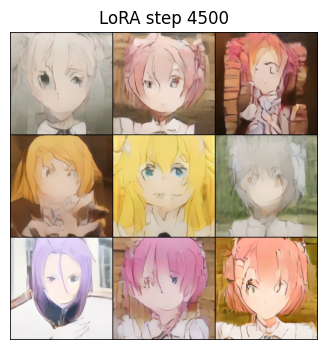<br>
4600 | loss 0.1397
  4700 | loss 0.0026
  4800 | loss 0.3908
  4900 | loss 0.3754
  5000 | loss 0.4683
999it [00:14, 66.79it/s]<br>
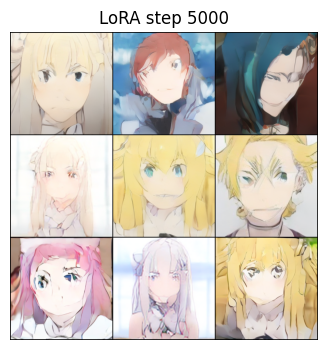<br>
5100 | loss 0.0398
  5200 | loss 0.1190
  5300 | loss 0.0128
  5400 | loss 0.0587
  5500 | loss 0.0749
999it [00:14, 67.31it/s]<br>
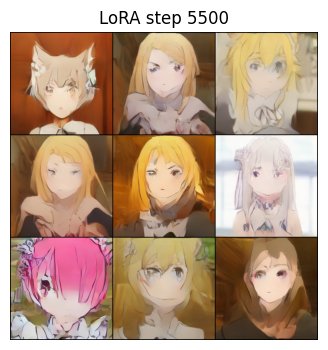<br>
5600 | loss 0.0072
  5700 | loss 0.0106
  5800 | loss 0.1491
  5900 | loss 0.2022
  6000 | loss 0.1261
999it [00:14, 66.62it/s]<br>
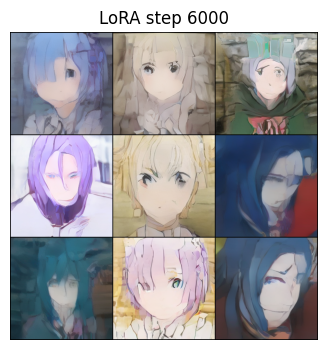<br>
6100 | loss 0.0422
  6200 | loss 0.0160
  6300 | loss 0.0647
  6400 | loss 0.0272
  6500 | loss 0.0871
999it [00:15, 65.11it/s]<br>
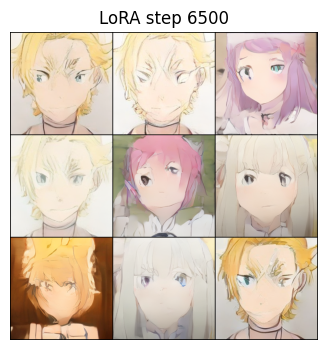<br>
6600 | loss 0.1710
  6700 | loss 0.0096
  6800 | loss 0.0008
  6900 | loss 0.2177
  7000 | loss 0.0012
999it [00:14, 66.70it/s]<br>
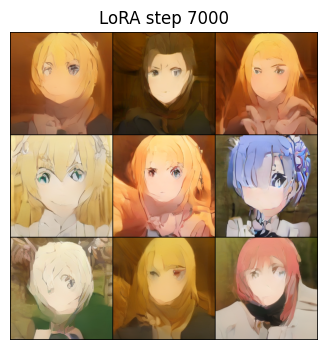<br>
7100 | loss 0.0337
  7200 | loss 0.0024
  7300 | loss 0.1816
  7400 | loss 0.2727
  7500 | loss 0.0705
999it [00:14, 66.80it/s]<br>
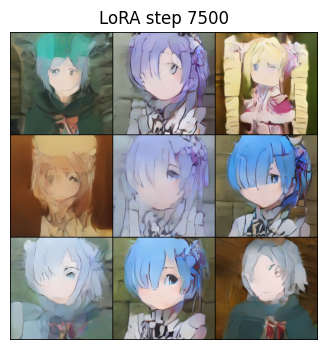<br>
7600 | loss 0.0075
  7700 | loss 0.0304
  7800 | loss 0.4465
  7900 | loss 0.3108
  8000 | loss 0.0076
999it [00:15, 66.31it/s]<br>
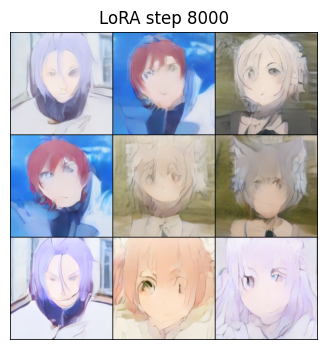<br>
8100 | loss 0.2731
  8200 | loss 0.0045
  8300 | loss 0.2886
  8400 | loss 0.1332
  8500 | loss 0.0645
999it [00:15, 66.31it/s]<br>
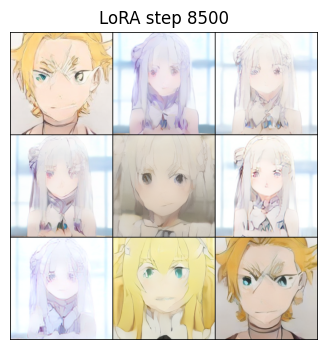<br>
8600 | loss 0.0499
  8700 | loss 0.0283
  8800 | loss 0.0038
  8900 | loss 0.0540
  9000 | loss 0.1077
999it [00:14, 67.49it/s]<br>
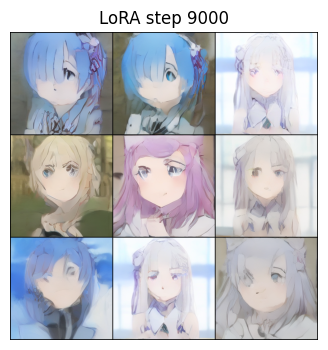<br>
9100 | loss 0.1452
  9200 | loss 0.1315
  9300 | loss 0.0206
  9400 | loss 0.4093
  9500 | loss 0.0300
999it [00:15, 66.59it/s]<br>
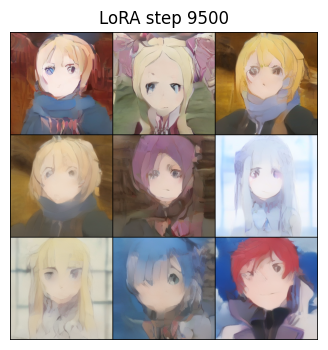<br>
9600 | loss 0.1191
  9700 | loss 0.0571
  9800 | loss 0.3539
  9900 | loss 0.0532
 10000 | loss 0.1758
999it [00:15, 66.36it/s]<br>
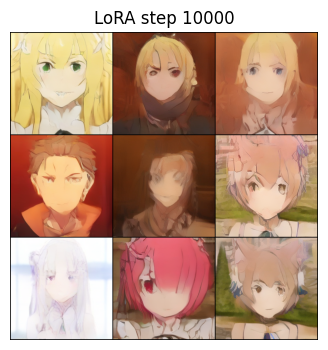<br>

In [ ]:
if isLoraTrain:
    generate_preview(unet, diffusion, vae, SCALE,
                            n_imgs=27, out_path=out_png,
                            title=f"Final Generation")

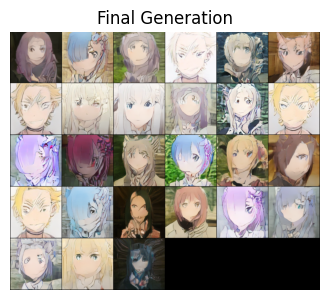

In [18]:
def set_lora_alpha(model, new_alpha: float):
    for m in model.modules():
        if isinstance(m, LoRAConv2d):
            r = m.A.size(0)                
            m.scaling = new_alpha / r

Load the finetuned model

In [16]:
unet = UNet(c_in=LATENT_CH, c_out=LATENT_CH,
            base=128, time_dim=256).to("cuda")
unet = apply_lora_to_unet(unet, rank=2, alpha=1.0).to("cuda")
ckpt  = torch.load("anime_full.pt", map_location="cpu")
unet.load_state_dict(ckpt["model"], strict=True)

<All keys matched successfully>

We can generate outputs here!

999it [00:14, 70.59it/s]


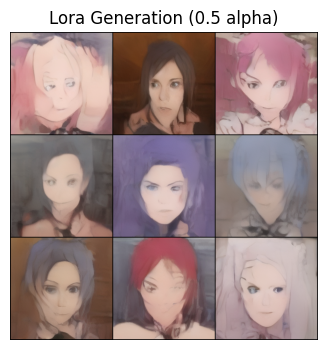

In [25]:
#out_png = "lora_outputs/alpha_0.50.png"
set_lora_alpha(unet, 0.05)
generate_preview(unet, diffusion, vae, SCALE,
                        n_imgs=9,
                        title=f"Lora Generation (0.5 alpha)")

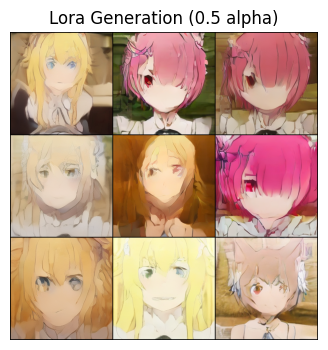

a few generations with different alphas:<br>
0.1 alpha<br>
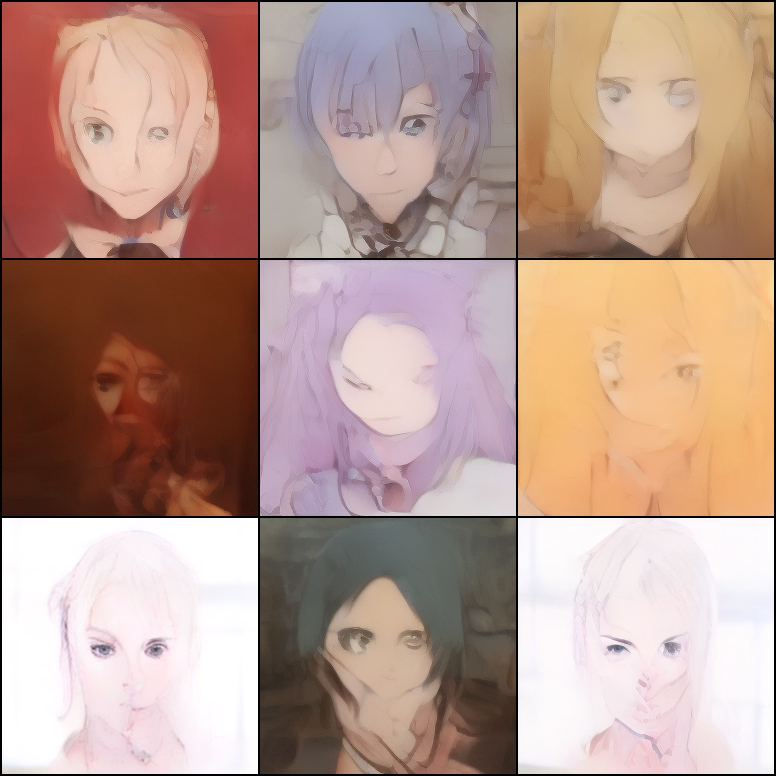<br>
0.15 alpha<br>
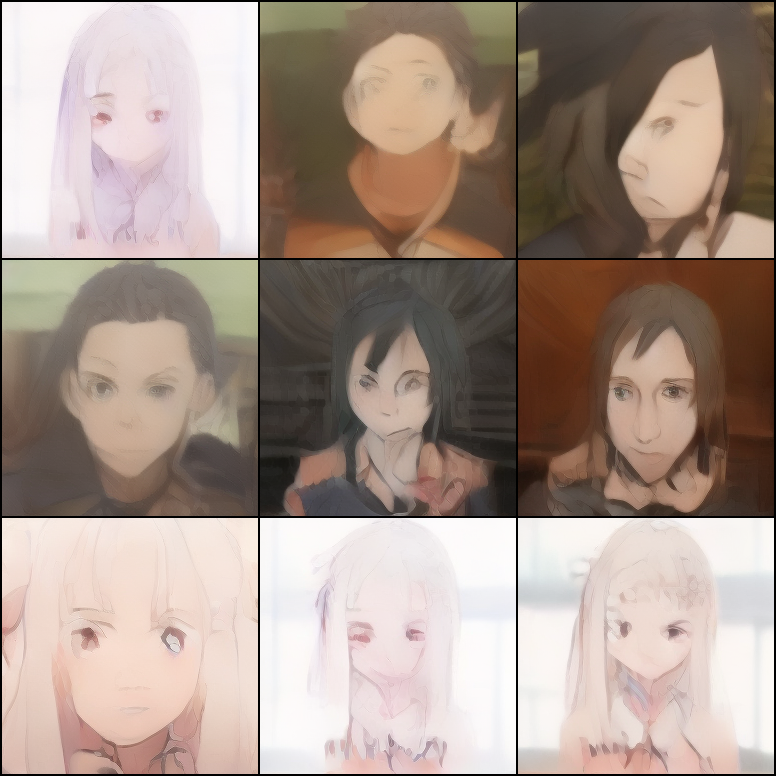<br>
0.20 alpha<br>
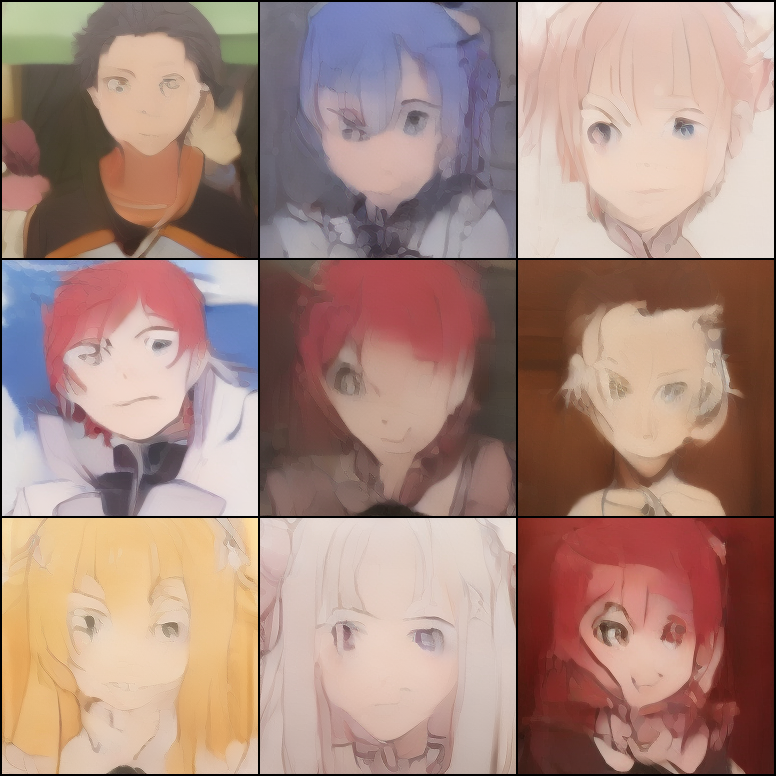<br>
0.50 alpha<br>
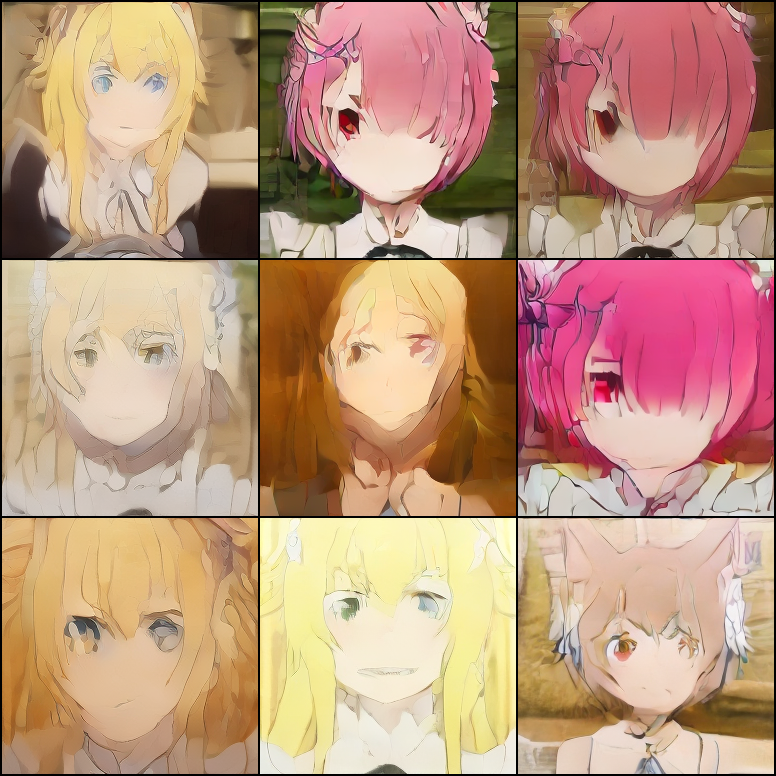<br>